# Détection et Classification des Animaux d'Élevage par Deep Learning
## Pipeline TDSP — YOLOv8 Classification | Version 6

---

### Contexte du projet

Ce notebook implémente un pipeline complet de classification d'images d'animaux d'élevage à l'aide de l'architecture **YOLOv8** (You Only Look Once, version 8) dans sa variante classification. Le projet s'inscrit dans le cadre méthodologique **TDSP (Team Data Science Process)** de Microsoft, garantissant une démarche rigoureuse, reproductible et orientée résultats.

**Espèces ciblées :** Bovin (*cow*), Cheval (*horse*), Caprin (*goat*), Ovin (*sheep*)

**Dataset local :** répertoire `data/` contenant quatre sous-dossiers correspondant aux quatre classes, sans téléchargement externe.

---

### Structure du pipeline — Phases TDSP

| Phase | Intitulé | Description |
|-------|----------|-------------|
| **Phase 0** | Installation & Configuration | Dépendances, environnement matériel, reproductibilité |
| **Phase 1** | Fonctions Utilitaires | Infrastructure de support au pipeline |
| **Phase 2** | Compréhension des Données *(Data Understanding)* | Audit qualité, statistiques descriptives, exploration visuelle |
| **Phase 3** | Partitionnement Stratifié *(Data Preparation — Split)* | Division 70 / 15 / 15 reproductible |
| **Phase 4** | Augmentation des Données *(Data Preparation — Augmentation)* | Rééquilibrage et enrichissement du jeu d'entraînement |
| **Phase 5** | Configuration du Dataset | Génération du fichier YAML de référence |
| **Phase 6** | Entraînement Baseline *(Modeling)* | Modèle léger YOLOv8n comme référence initiale |
| **Phase 7** | Fine-Tuning *(Modeling)* | Modèle intermédiaire YOLOv8s avec transfert de connaissance |
| **Phase 8** | Entraînement Turbo *(Modeling)* | Modèle large YOLOv8m conditionné à la disponibilité GPU |
| **Phase 9** | Évaluation & Sélection *(Evaluation)* | Comparaison des modèles, sélection du meilleur candidat |
| **Phase 10** | Analyse des Erreurs | Matrice de confusion, rapport de classification, courbes d'apprentissage |
| **Phase 11** | Inférences Qualitatives | Visualisation des prédictions sur le jeu de test |
| **Phase 12** | Explicabilité *(XAI — GradCAM)* | Cartes d'activation pour l'interprétabilité du modèle |
| **Phase 13** | Export Multi-Format *(Deployment)* | ONNX, TorchScript, OpenVINO |
| **Phase 14** | Benchmark d'Inférence | Mesure des performances en production |
| **Phase 15** | Rapport Final Automatique | Synthèse documentée et persistante |

---

> **Note d'utilisation :** Exécuter les cellules dans l'ordre séquentiel. Les variables définies dans les phases précédentes sont utilisées dans les phases suivantes.


## Phase 0 — Installation et Configuration de l'Environnement

In [1]:
# ─────────────────────────────────────────────────────────────────────────────
# Installation des dépendances du projet
# ─────────────────────────────────────────────────────────────────────────────
import subprocess, sys, os, json, shutil, random, time, warnings
from pathlib import Path
from collections import Counter, defaultdict

packages = [
    "ultralytics>=8.2",
    "opencv-python-headless",
    "pandas>=2.0",
    "numpy>=1.24",
    "matplotlib>=3.7",
    "scikit-learn>=1.3",
    "Pillow>=10.0",
    "tqdm>=4.66",
    "seaborn>=0.13",
    "pyyaml>=6.0",
]

print("Vérification et installation des dépendances...")
subprocess.run([sys.executable, "-m", "pip", "install", "-q"] + packages, check=False)

import numpy as np
import math
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from PIL import Image, ImageEnhance, ImageOps
from tqdm import tqdm
import yaml
import torch

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import ultralytics
from ultralytics import YOLO

warnings.filterwarnings("ignore")
sns.set_style("whitegrid")
plt.rcParams["figure.dpi"] = 110
plt.rcParams["font.size"] = 11

# Détection de l'environnement matériel
HAS_CUDA = torch.cuda.is_available()
DEVICE   = 0 if HAS_CUDA else "cpu"
GPU_NAME = torch.cuda.get_device_name(0) if HAS_CUDA else "CPU"
VRAM_GB  = torch.cuda.get_device_properties(0).total_memory / 1e9 if HAS_CUDA else 0

print("=" * 70)
print("RAPPORT D'ENVIRONNEMENT")
print("=" * 70)
print(f"  PyTorch     : {torch.__version__}")
print(f"  Ultralytics : {ultralytics.__version__}")
print(f"  CUDA        : {HAS_CUDA}")
print(f"  Périphérique: {GPU_NAME}")
if HAS_CUDA:
    print(f"  VRAM        : {VRAM_GB:.1f} GB")
print("=" * 70)


Vérification et installation des dépendances...
RAPPORT D'ENVIRONNEMENT
  PyTorch     : 2.11.0+cpu
  Ultralytics : 8.4.39
  CUDA        : False
  Périphérique: CPU


## Phase 1 — Fonctions Utilitaires et Configuration Globale

In [2]:
# ─────────────────────────────────────────────────────────────────────────────
# Reproductibilité : fixation des graines aléatoires
# ─────────────────────────────────────────────────────────────────────────────
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if HAS_CUDA:
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.benchmark = True

# ─────────────────────────────────────────────────────────────────────────────
# Chemins du projet
# ─────────────────────────────────────────────────────────────────────────────
WORKDIR    = Path.cwd()
DATA_DIR   = WORKDIR / "data"                  # Dataset source : cow / horse / goat / sheep
ARTIFACTS  = WORKDIR / "tdsp_livestock_v7"     # Répertoire racine des artefacts
SPLIT_DIR  = ARTIFACTS / "split_cls"           # Données partitionnées
AUG_DIR    = ARTIFACTS / "augmented_cls"       # Données augmentées (entrée entraînement)
RUNS_DIR   = ARTIFACTS / "runs"                # Résultats des entraînements
EXPORT_DIR = ARTIFACTS / "exports"             # Modèles exportés
REPORT_DIR = ARTIFACTS / "reports"             # Rapports textuels
XAI_DIR    = ARTIFACTS / "xai"                 # Cartes d'activation GradCAM

for d in [ARTIFACTS, SPLIT_DIR, AUG_DIR, RUNS_DIR, EXPORT_DIR, REPORT_DIR, XAI_DIR]:
    d.mkdir(parents=True, exist_ok=True)

# ─────────────────────────────────────────────────────────────────────────────
# Métadonnées des classes
# ─────────────────────────────────────────────────────────────────────────────
SOURCE_CLASSES = ["cow", "horse", "goat", "sheep"]

DISPLAY_NAMES = {
    "cow":   "Bovin",
    "horse": "Cheval",
    "goat":  "Caprin",
    "sheep": "Ovin",
}

CLASS_COLORS = {
    "cow":   (52, 152, 219),
    "horse": (241, 196, 15),
    "goat":  (231, 76, 60),
    "sheep": (46, 204, 113),
}

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

# ─────────────────────────────────────────────────────────────────────────────
# Fonctions utilitaires
# ─────────────────────────────────────────────────────────────────────────────
def list_images(folder: Path):
    """Retourne la liste triée des fichiers image dans un dossier (récursif)."""
    if not folder.exists():
        return []
    return sorted([p for p in folder.rglob("*") if p.suffix.lower() in IMG_EXTS])

def is_valid_image(path: Path) -> bool:
    """Vérifie l'intégrité d'un fichier image via PIL."""
    try:
        with Image.open(path) as im:
            im.verify()
        return True
    except Exception:
        return False

def ensure_clean_dir(path: Path):
    """Supprime et recrée un répertoire propre."""
    if path.exists():
        shutil.rmtree(path)
    path.mkdir(parents=True, exist_ok=True)

def plot_counts(df: pd.DataFrame, x: str, y: str, title: str, ax=None):
    """Génère un diagramme en barres annoté."""
    if ax is None:
        ax = plt.gca()
    bars = ax.bar(df[x], df[y])
    ax.set_title(title, fontweight="bold")
    ax.grid(axis="y", alpha=0.25)
    ax.set_xlabel("")
    ax.set_ylabel(y.replace("_", " ").title())
    for b in bars:
        h = b.get_height()
        ax.text(b.get_x() + b.get_width() / 2, h + max(0.5, h * 0.01), f"{int(h)}",
                ha="center", va="bottom", fontsize=9, fontweight="bold")
    return ax

def class_counts_from_folder(root: Path):
    """Compte les images valides par classe dans un dossier racine."""
    rows = []
    for cls in SOURCE_CLASSES:
        folder = root / cls
        files  = list_images(folder)
        rows.append({
            "class":   cls,
            "display": DISPLAY_NAMES[cls],
            "count":   len(files),
        })
    return pd.DataFrame(rows)

def copy_image(src: Path, dst: Path):
    """Copie une image vers sa destination en créant les dossiers intermédiaires."""
    dst.parent.mkdir(parents=True, exist_ok=True)
    shutil.copy2(src, dst)

print("Fonctions utilitaires initialisées.")
print(f"Répertoire de travail : {WORKDIR}")
print(f"Répertoire des artefacts : {ARTIFACTS}")


Fonctions utilitaires initialisées.
Répertoire de travail : g:\HP\Nouveaudd
Répertoire des artefacts : g:\HP\Nouveaudd\tdsp_livestock_v7


## Phase 2 — Compréhension des Données *(Data Understanding)*

Cette phase correspond à l'étape **Data Understanding** du processus TDSP. L'objectif est d'auditer la qualité du dataset, de vérifier l'intégrité des fichiers, d'identifier d'éventuels déséquilibres entre classes, et de visualiser des échantillons représentatifs pour s'assurer de la cohérence des données avant tout traitement.

**Indicateurs examinés :**
- Nombre d'images valides par classe
- Présence ou absence de fichiers corrompus
- Équilibre de la distribution inter-classes
- Diversité visuelle au sein de chaque classe


Dataset source détecté : g:\HP\Nouveaudd\data

class display  valid_images
  cow   Bovin          2000
horse  Cheval          2000
 goat  Caprin          2000
sheep    Ovin          1999


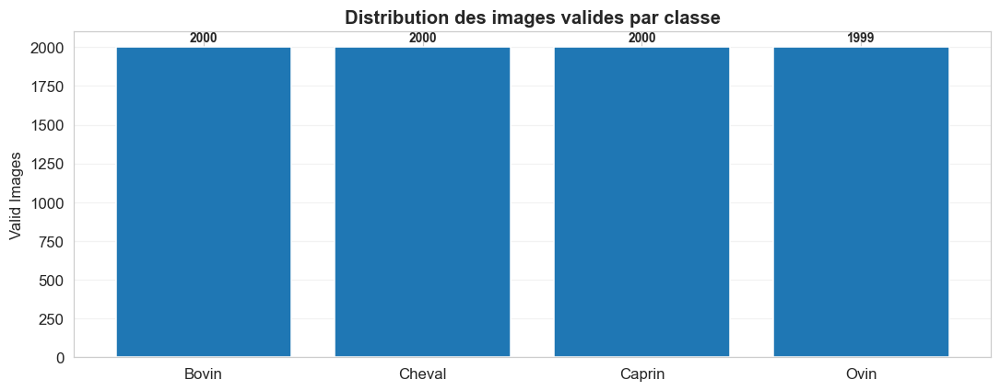

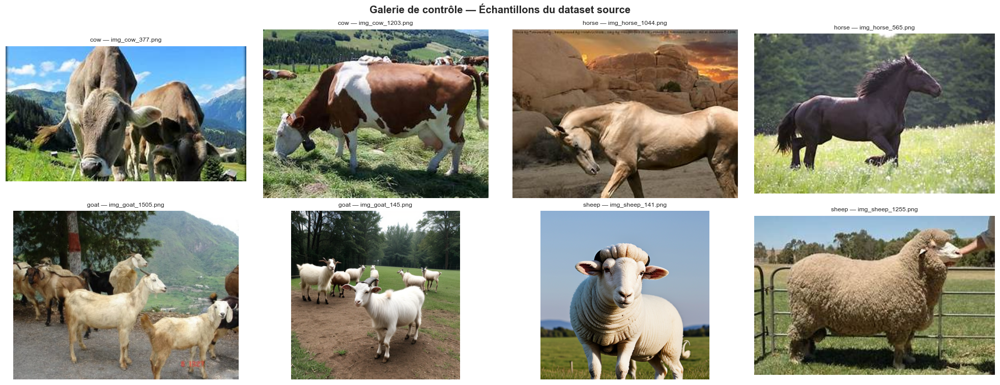


──────────────────────────────────────────────────
SYNTHÈSE — COMPRÉHENSION DES DONNÉES
──────────────────────────────────────────────────
  Images valides totales : 7999
  Nombre de classes      : 4
  Classe la plus fournie : 2000 images
  Classe la moins fournie: 1999 images
  Ratio de déséquilibre  : 1.00x
  → Distribution relativement équilibrée entre les classes.


In [3]:
# ─────────────────────────────────────────────────────────────────────────────
# Vérification de l'existence et de l'intégrité du dataset source
# ─────────────────────────────────────────────────────────────────────────────
if not DATA_DIR.exists():
    raise FileNotFoundError(
        f"Le répertoire source '{DATA_DIR}' est introuvable. "
        "Veuillez placer le dataset dans le sous-dossier './data' "
        "avec les sous-dossiers cow/, horse/, goat/, sheep/."
    )

missing = [c for c in SOURCE_CLASSES if not (DATA_DIR / c).exists()]
if missing:
    raise FileNotFoundError(
        f"Les sous-dossiers suivants sont absents dans data/ : {missing}"
    )

# Comptage des images valides par classe
source_df = class_counts_from_folder(DATA_DIR)
source_df["valid_images"] = [
    sum(1 for p in list_images(DATA_DIR / cls) if is_valid_image(p))
    for cls in SOURCE_CLASSES
]

print("Dataset source détecté :", DATA_DIR)
print()
print(source_df[["class", "display", "valid_images"]].to_string(index=False))

# ─────────────────────────────────────────────────────────────────────────────
# Visualisation de la distribution du dataset
# ─────────────────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(1, 1, figsize=(10, 4))
plot_counts(source_df, "display", "valid_images", "Distribution des images valides par classe", ax=ax)
plt.tight_layout()
plt.show()

# ─────────────────────────────────────────────────────────────────────────────
# Galerie d'échantillons — contrôle visuel de la qualité des données
# ─────────────────────────────────────────────────────────────────────────────
samples = []
for cls in SOURCE_CLASSES:
    imgs = [p for p in list_images(DATA_DIR / cls) if is_valid_image(p)]
    if imgs:
        samples.extend(random.sample(imgs, min(2, len(imgs))))

n_cols = max(1, math.ceil(len(samples) / 2))
fig, axes = plt.subplots(2, n_cols, figsize=(18, 7))
axes = np.array(axes).reshape(-1)
for ax, img_path in zip(axes, samples):
    img = cv2.imread(str(img_path))
    if img is None:
        ax.set_visible(False)
        continue
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(f"{img_path.parent.name} — {img_path.name[:18]}", fontsize=8)
    ax.axis("off")
for ax in axes[len(samples):]:
    ax.axis("off")
plt.suptitle("Galerie de contrôle — Échantillons du dataset source", fontweight="bold")
plt.tight_layout()
plt.show()

# ─────────────────────────────────────────────────────────────────────────────
# Synthèse quantitative
# ─────────────────────────────────────────────────────────────────────────────
total_images  = int(source_df["valid_images"].sum())
min_cls_count = int(source_df["valid_images"].min())
max_cls_count = int(source_df["valid_images"].max())
imbalance_ratio = max_cls_count / max(min_cls_count, 1)

print("\n" + "─" * 50)
print("SYNTHÈSE — COMPRÉHENSION DES DONNÉES")
print("─" * 50)
print(f"  Images valides totales : {total_images}")
print(f"  Nombre de classes      : {len(source_df)}")
print(f"  Classe la plus fournie : {max_cls_count} images")
print(f"  Classe la moins fournie: {min_cls_count} images")
print(f"  Ratio de déséquilibre  : {imbalance_ratio:.2f}x")
if imbalance_ratio > 2.0:
    print("  → Déséquilibre significatif détecté. L'augmentation en Phase 4 est nécessaire.")
else:
    print("  → Distribution relativement équilibrée entre les classes.")


## Phase 3 — Partitionnement Stratifié du Dataset *(Data Preparation — Split)*

Cette phase réalise la division du dataset selon une stratégie **stratifiée 70 % / 15 % / 15 %** (entraînement / validation / test), garantissant que chaque partition respecte proportionnellement la distribution originale des classes. La reproductibilité est assurée par la graine aléatoire fixée en Phase 1.

**Partitions générées :**
- `train/` — apprentissage des paramètres du modèle
- `val/`   — ajustement des hyperparamètres et early stopping
- `test/`  — évaluation finale sur données non vues


Récapitulatif du partitionnement :
class display  train  val  test  total
  cow   Bovin   1400  300   300   2000
horse  Cheval   1400  300   300   2000
 goat  Caprin   1400  300   300   2000
sheep    Ovin   1399  300   300   1999


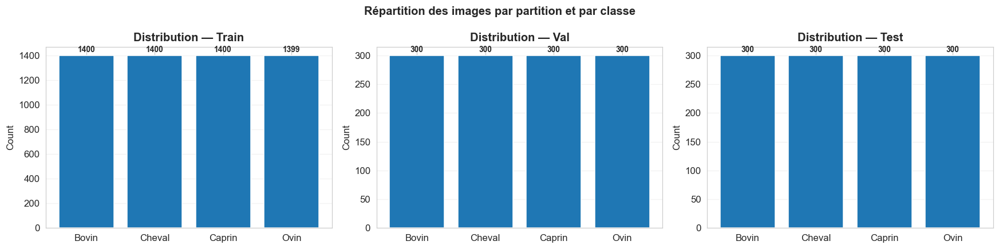


Partitionnement terminé : g:\HP\Nouveaudd\tdsp_livestock_v7\split_cls


In [4]:
# ─────────────────────────────────────────────────────────────────────────────
# Partitionnement stratifié 70 / 15 / 15
# ─────────────────────────────────────────────────────────────────────────────
ensure_clean_dir(SPLIT_DIR)

def stratified_split_class(src_cls: str, train_ratio=0.70, val_ratio=0.15, test_ratio=0.15):
    """
    Divise les images d'une classe selon les ratios fournis et copie
    les fichiers dans la structure SPLIT_DIR/{train,val,test}/{class}/.
    """
    assert abs(train_ratio + val_ratio + test_ratio - 1.0) < 1e-6,         "Les ratios de partitionnement doivent sommer à 1.0"

    src_folder = DATA_DIR / src_cls
    files = [p for p in list_images(src_folder) if is_valid_image(p)]
    random.shuffle(files)
    n = len(files)

    if n == 0:
        return {"train": 0, "val": 0, "test": 0}

    n_test  = max(1, int(round(n * test_ratio)))  if n >= 3 else max(0, n - 1)
    n_val   = max(1, int(round(n * val_ratio)))   if n - n_test >= 3 else max(0, n - n_test - 1)
    n_train = max(1, n - n_val - n_test)

    # Correction si la somme diffère de n (arrondi)
    while n_train + n_val + n_test > n:
        if n_train > 1:   n_train -= 1
        elif n_val   > 0: n_val   -= 1
        elif n_test  > 0: n_test  -= 1
    while n_train + n_val + n_test < n:
        n_train += 1

    splits = {
        "train": files[:n_train],
        "val":   files[n_train:n_train + n_val],
        "test":  files[n_train + n_val:n_train + n_val + n_test],
    }

    for split_name, split_files in splits.items():
        for p in split_files:
            copy_image(p, SPLIT_DIR / split_name / src_cls / p.name)

    return {k: len(v) for k, v in splits.items()}

# Application à toutes les classes
split_summary = []
for cls in SOURCE_CLASSES:
    s = stratified_split_class(cls)
    split_summary.append({
        "class":   cls,
        "display": DISPLAY_NAMES[cls],
        **s,
        "total":   sum(s.values()),
    })

split_df = pd.DataFrame(split_summary)
print("Récapitulatif du partitionnement :")
print(split_df.to_string(index=False))

# Visualisation de la distribution par partition
fig, axes = plt.subplots(1, 3, figsize=(16, 4))
for ax, split_name in zip(axes, ["train", "val", "test"]):
    sub = split_df[["display", split_name]].rename(
        columns={"display": "class", split_name: "count"}
    )
    plot_counts(sub, "class", "count", f"Distribution — {split_name.capitalize()}", ax=ax)
plt.suptitle("Répartition des images par partition et par classe", fontweight="bold")
plt.tight_layout()
plt.show()

print("\nPartitionnement terminé :", SPLIT_DIR)


## Phase 4 — Augmentation des Données *(Data Preparation — Augmentation)*

L'augmentation offline est appliquée **uniquement à la partition d'entraînement** dans le but de rééquilibrer les classes sous-représentées. Les partitions de validation et de test sont copiées sans modification afin de préserver l'objectivité de l'évaluation.

**Transformations appliquées :**
- Retournement horizontal aléatoire (p = 0.5)
- Retournement vertical aléatoire (p = 0.3)
- Rotation légère (±12°)
- Ajustement de la luminosité (±18 %)
- Ajustement du contraste (±18 %)
- Ajustement de la saturation (±15 %)

**Note :** YOLOv8 applique également des augmentations en ligne (*online*) lors de l'entraînement ; l'augmentation offline ici sert avant tout à l'équilibrage.


Statistiques d'augmentation :
class display  train_before  generated  train_after  val  test
  cow   Bovin          1400          0         1400  300   300
horse  Cheval          1400          0         1400  300   300
 goat  Caprin          1400          0         1400  300   300
sheep    Ovin          1399          1         1400  300   300


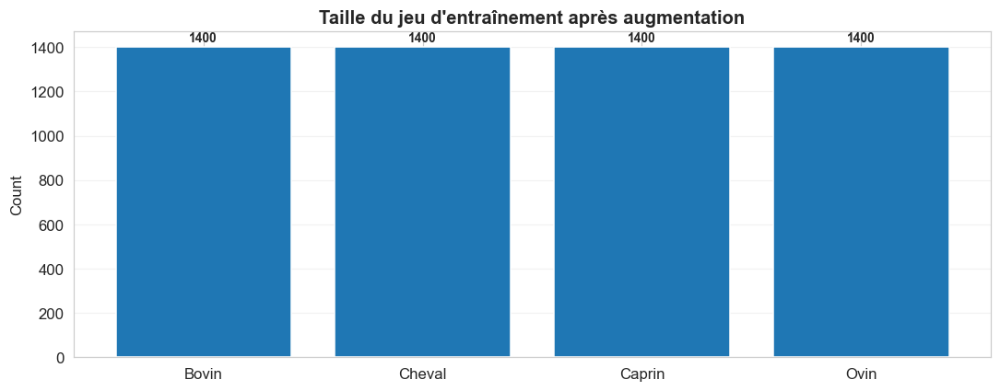


Augmentation terminée : g:\HP\Nouveaudd\tdsp_livestock_v7\augmented_cls


In [5]:
# ─────────────────────────────────────────────────────────────────────────────
# Augmentation offline pour rééquilibrage du jeu d'entraînement
# ─────────────────────────────────────────────────────────────────────────────
def augment_classification_image(img: Image.Image) -> Image.Image:
    """Applique une série de transformations aléatoires à une image PIL."""
    img = img.convert("RGB")
    if random.random() < 0.5:
        img = ImageOps.mirror(img)
    if random.random() < 0.3:
        img = ImageOps.flip(img)
    angle = random.uniform(-12, 12)
    img = img.rotate(angle, resample=Image.Resampling.BILINEAR, expand=False)
    if random.random() < 0.6:
        img = ImageEnhance.Brightness(img).enhance(random.uniform(0.85, 1.18))
    if random.random() < 0.6:
        img = ImageEnhance.Contrast(img).enhance(random.uniform(0.85, 1.18))
    if random.random() < 0.4:
        img = ImageEnhance.Color(img).enhance(random.uniform(0.85, 1.15))
    return img

# Cible : aligner toutes les classes sur le maximum observé dans train
train_counts = {cls: len(list_images(SPLIT_DIR / "train" / cls)) for cls in SOURCE_CLASSES}
target_count = max(train_counts.values()) if train_counts else 0

aug_stats = []
for cls in SOURCE_CLASSES:
    src_files = [p for p in list_images(SPLIT_DIR / "train" / cls) if is_valid_image(p)]
    current   = len(src_files)
    needed    = max(0, target_count - current)
    generated = 0

    out_dir = AUG_DIR / "train" / cls
    out_dir.mkdir(parents=True, exist_ok=True)

    # Copie des images originales
    for p in src_files:
        copy_image(p, out_dir / p.name)

    # Génération des variantes augmentées si nécessaire
    if needed > 0 and src_files:
        idx = 0
        while generated < needed:
            src = src_files[idx % len(src_files)]
            try:
                with Image.open(src) as im:
                    aug      = augment_classification_image(im)
                    new_name = f"{src.stem}_aug{generated:04d}{src.suffix.lower()}"
                    aug.save(out_dir / new_name)
                    generated += 1
            except Exception:
                pass
            idx += 1

    # Copie directe des partitions validation et test (sans augmentation)
    for split_name in ["val", "test"]:
        dst_dir = AUG_DIR / split_name / cls
        dst_dir.mkdir(parents=True, exist_ok=True)
        for p in list_images(SPLIT_DIR / split_name / cls):
            if is_valid_image(p):
                copy_image(p, dst_dir / p.name)

    aug_stats.append({
        "class":        cls,
        "display":      DISPLAY_NAMES[cls],
        "train_before": current,
        "generated":    generated,
        "train_after":  len(list_images(AUG_DIR / "train" / cls)),
        "val":          len(list_images(AUG_DIR / "val" / cls)),
        "test":         len(list_images(AUG_DIR / "test" / cls)),
    })

aug_df = pd.DataFrame(aug_stats)
print("Statistiques d'augmentation :")
print(aug_df.to_string(index=False))

# Visualisation après augmentation
fig, ax = plt.subplots(1, 1, figsize=(10, 4))
plot_counts(
    aug_df[["display", "train_after"]].rename(columns={"display": "class", "train_after": "count"}),
    "class", "count", "Taille du jeu d'entraînement après augmentation", ax=ax
)
plt.tight_layout()
plt.show()

print("\nAugmentation terminée :", AUG_DIR)


## Phase 5 — Configuration du Dataset (fichier YAML)

In [6]:
# ─────────────────────────────────────────────────────────────────────────────
# Génération du fichier de configuration YAML pour Ultralytics
# ─────────────────────────────────────────────────────────────────────────────
# Pour la classification, YOLOv8 utilise directement l'arborescence des dossiers.
# Le fichier YAML ci-dessous sert de référence documentaire au pipeline.

DATASET_YAML = ARTIFACTS / "dataset_cls.yaml"

cfg = {
    "path":  str(AUG_DIR),
    "train": "train",
    "val":   "val",
    "test":  "test",
    "names": {i: cls for i, cls in enumerate(sorted(SOURCE_CLASSES))},
}

with open(DATASET_YAML, "w", encoding="utf-8") as f:
    yaml.safe_dump(cfg, f, sort_keys=False, allow_unicode=True)

print("Fichier de configuration généré :", DATASET_YAML)
print()
print(DATASET_YAML.read_text(encoding="utf-8"))


Fichier de configuration généré : g:\HP\Nouveaudd\tdsp_livestock_v7\dataset_cls.yaml

path: g:\HP\Nouveaudd\tdsp_livestock_v7\augmented_cls
train: train
val: val
test: test
names:
  0: cow
  1: goat
  2: horse
  3: sheep



## Phase 6 — Entraînement Baseline *(Modeling)*

La première expérience utilise **YOLOv8n-cls** (*nano*), le modèle le plus léger de la famille YOLOv8. Cette configuration sert de **référence de base** (*baseline*) : ses résultats serviront d'ancre de comparaison pour les expériences suivantes.

**Hyperparamètres principaux :**
- Backbone : YOLOv8n-cls (pré-entraîné ImageNet)
- Optimiseur : AdamW — lr₀ = 1e-3
- Epochs : 25 — Early stopping : patience = 8
- Taille d'image : 224 × 224 px


In [7]:
# ─────────────────────────────────────────────────────────────────────────────
# Entraînement du modèle baseline : YOLOv8n-cls
# ─────────────────────────────────────────────────────────────────────────────
BASELINE_RUN = RUNS_DIR / "baseline_cls_v6"
BASELINE_RUN.mkdir(parents=True, exist_ok=True)

baseline_model   = YOLO("yolov8n-cls.pt")
baseline_results = baseline_model.train(
    data         = str(AUG_DIR),
    epochs       = 25,
    imgsz        = 224,
    batch        = -1 if HAS_CUDA else 16,
    device       = DEVICE,
    optimizer    = "AdamW",
    lr0          = 1e-3,
    weight_decay = 5e-4,
    patience     = 8,
    project      = str(RUNS_DIR),
    name         = "baseline_cls_v6",
    seed         = SEED,
    pretrained   = True,
    save         = True,
    plots        = True,
    verbose      = True,
)

BASELINE_BEST = RUNS_DIR / "baseline_cls_v6" / "weights" / "best.pt"
print("Entraînement baseline terminé.")
print("Meilleurs poids sauvegardés :", BASELINE_BEST)


Ultralytics 8.4.39  Python-3.12.6 torch-2.11.0+cpu CPU (11th Gen Intel Core i5-1135G7 @ 2.40GHz)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=g:\HP\Nouveaudd\tdsp_livestock_v7\augmented_cls, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=25, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-cls.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=baseline_cls_v6-2, nbs=64, nms=False, opset=None, optimize=False, 

## Phase 7 — Fine-Tuning *(Modeling)*

Le fine-tuning utilise **YOLOv8s-cls** (*small*), un modèle de capacité supérieure, entraîné avec un cosine learning rate scheduler pour une convergence plus stable. Cette configuration vise à surpasser la baseline en exploitant un réseau plus expressif.

**Hyperparamètres principaux :**
- Backbone : YOLOv8s-cls (pré-entraîné ImageNet)
- Optimiseur : AdamW — lr₀ = 8e-4 — Cosine LR decay
- Epochs : 40 — Early stopping : patience = 12
- Taille d'image : 320 × 320 px


In [8]:
# ─────────────────────────────────────────────────────────────────────────────
# Téléchargement des poids YOLOv8s-cls (avec fallback SSL désactivé)
# ─────────────────────────────────────────────────────────────────────────────
import requests
import urllib3

urllib3.disable_warnings(urllib3.exceptions.InsecureRequestWarning)

weight_path = "yolov8s-cls.pt"
if not os.path.exists(weight_path):
    print(f"Téléchargement des poids : {weight_path}")
    url = "https://github.com/ultralytics/assets/releases/download/v8.2.0/yolov8s-cls.pt"
    try:
        r = requests.get(url, verify=False, stream=True)
        r.raise_for_status()
        with open(weight_path, "wb") as f:
            for chunk in r.iter_content(chunk_size=8192):
                f.write(chunk)
        print("Téléchargement réussi.")
    except Exception as e:
        print(f"Échec du téléchargement : {e}")
        print("YOLOv8 tentera un téléchargement automatique lors de l'initialisation.")

# ─────────────────────────────────────────────────────────────────────────────
# Entraînement du modèle fine-tuné : YOLOv8s-cls
# ─────────────────────────────────────────────────────────────────────────────
FINETUNE_RUN = RUNS_DIR / "finetune_cls_v6"
FINETUNE_RUN.mkdir(parents=True, exist_ok=True)

finetune_model   = YOLO(weight_path)
finetune_results = finetune_model.train(
    data         = str(AUG_DIR),
    epochs       = 10,
    imgsz        = 320,
    batch        = -1 if HAS_CUDA else 16,
    device       = DEVICE,
    optimizer    = "AdamW",
    lr0          = 8e-4,
    weight_decay = 5e-4,
    patience     = 12,
    cos_lr       = True,
    project      = str(RUNS_DIR),
    name         = "finetune_cls_v6",
    seed         = SEED,
    pretrained   = True,
    save         = True,
    plots        = True,
    verbose      = True,
)

FINETUNE_BEST = RUNS_DIR / "finetune_cls_v6" / "weights" / "best.pt"
print("Fine-tuning terminé.")
print("Meilleurs poids sauvegardés :", FINETUNE_BEST)


Ultralytics 8.4.39  Python-3.12.6 torch-2.11.0+cpu CPU (11th Gen Intel Core i5-1135G7 @ 2.40GHz)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=g:\HP\Nouveaudd\tdsp_livestock_v7\augmented_cls, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=320, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0008, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s-cls.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=finetune_cls_v6-2, nbs=64, nms=False, opset=None, optimize=False, 

## Phase 8 — Entraînement Turbo *(Modeling — optionnel)*

Cette expérience, conditionnée à la disponibilité d'un GPU avec ≥ 8 GB de VRAM, utilise **YOLOv8m-cls** (*medium*) avec SGD et momentum, une stratégie adaptée à la convergence des réseaux plus profonds. En l'absence de GPU suffisant, le meilleur candidat des phases 6 et 7 est retenu.


In [9]:
# ─────────────────────────────────────────────────────────────────────────────
# Entraînement du modèle turbo : YOLOv8m-cls (conditionné au GPU)
# ─────────────────────────────────────────────────────────────────────────────
TURBO_BEST = FINETUNE_BEST  # Valeur par défaut si turbo non exécuté
turbo_ran  = False

if HAS_CUDA and VRAM_GB >= 8:
    turbo_ran  = True
    turbo_model = YOLO("yolov8m-cls.pt")
    turbo_results = turbo_model.train(
        data         = str(AUG_DIR),
        epochs       = 20,
        imgsz        = 384,
        batch        = -1,
        device       = DEVICE,
        optimizer    = "SGD",
        lr0          = 5e-4,
        momentum     = 0.937,
        weight_decay = 5e-4,
        cos_lr       = True,
        patience     = 15,
        project      = str(RUNS_DIR),
        name         = "turbo_cls_v6",
        seed         = SEED,
        pretrained   = True,
        save         = True,
        plots        = True,
        verbose      = True,
    )
    TURBO_BEST = RUNS_DIR / "turbo_cls_v6" / "weights" / "best.pt"
    print("Entraînement turbo terminé.")
    print("Meilleurs poids sauvegardés :", TURBO_BEST)
else:
    print("Entraînement turbo ignoré (GPU insuffisant ou absent).")
    print("Le meilleur candidat sera sélectionné parmi baseline et fine-tuning.")


Entraînement turbo ignoré (GPU insuffisant ou absent).
Le meilleur candidat sera sélectionné parmi baseline et fine-tuning.


## Phase 9 — Évaluation et Sélection du Meilleur Modèle *(Evaluation)*

Les trois candidats sont évalués sur la partition de validation selon la métrique **Top-1 Accuracy** (précision de la première prédiction). Le modèle présentant la meilleure performance est retenu pour l'analyse approfondie et l'export.


In [11]:
# ─────────────────────────────────────────────────────────────────────────────
# Extraction des métriques depuis l'objet de résultats YOLOv8
# ─────────────────────────────────────────────────────────────────────────────
def extract_cls_metrics(metrics_obj):
    """Extrait les métriques top1/top5 depuis un objet de validation Ultralytics."""
    out = {}
    for attr in ["top1", "top5"]:
        val = getattr(metrics_obj, attr, None)
        if isinstance(val, (int, float, np.floating)):
            out[attr] = float(val)
    rd = getattr(metrics_obj, "results_dict", None)
    if isinstance(rd, dict):
        for k, v in rd.items():
            if isinstance(v, (int, float, np.floating)):
                out[k] = float(v)
    return out

def load_model_metrics(model_path: Path, data_root: Path):
    """Charge un modèle et évalue ses performances sur la partition de validation."""
    m = YOLO(str(model_path))
    v = m.val(data=str(data_root), imgsz=320, split="val", verbose=False)
    return m, extract_cls_metrics(v)

# ─────────────────────────────────────────────────────────────────────────────
# Évaluation de chaque candidat
# ─────────────────────────────────────────────────────────────────────────────
baseline_model_loaded, baseline_metrics = load_model_metrics(BASELINE_BEST, AUG_DIR)
finetune_model_loaded, finetune_metrics = load_model_metrics(FINETUNE_BEST, AUG_DIR)

# Sélection initiale
best_candidate  = "baseline"
best_model_path = BASELINE_BEST
best_metrics    = baseline_metrics

if finetune_metrics.get("top1", 0) >= best_metrics.get("top1", 0):
    best_candidate  = "finetune"
    best_model_path = FINETUNE_BEST
    best_metrics    = finetune_metrics

# Inclusion du turbo si disponible
turbo_metrics = {}
if TURBO_BEST.exists() and turbo_ran:
    _, turbo_metrics = load_model_metrics(TURBO_BEST, AUG_DIR)
    if turbo_metrics.get("top1", 0) >= best_metrics.get("top1", 0):
        best_candidate  = "turbo"
        best_model_path = TURBO_BEST
        best_metrics    = turbo_metrics

# Tableau comparatif
candidates = [{"Modèle": "Baseline (YOLOv8n)", **baseline_metrics},
              {"Modèle": "Fine-tune (YOLOv8s)", **finetune_metrics}]
if turbo_metrics:
    candidates.append({"Modèle": "Turbo (YOLOv8m)", **turbo_metrics})

eval_df = pd.DataFrame(candidates)
print("Comparaison des modèles — Validation Set")
print(eval_df.to_string(index=False))
print(f"\nModèle retenu : {best_candidate.upper()}")
print(f"Chemin        : {best_model_path}")


Ultralytics 8.4.39  Python-3.12.6 torch-2.11.0+cpu CPU (11th Gen Intel Core i5-1135G7 @ 2.40GHz)
YOLOv8n-cls summary (fused): 30 layers, 1,440,004 parameters, 0 gradients, 3.3 GFLOPs
train: G:\HP\Nouveaudd\tdsp_livestock_v7\augmented_cls\train... found 5600 images in 4 classes  
val: G:\HP\Nouveaudd\tdsp_livestock_v7\augmented_cls\val... found 1200 images in 4 classes  
test: G:\HP\Nouveaudd\tdsp_livestock_v7\augmented_cls\test... found 1200 images in 4 classes  
val: Fast image access  (ping: 0.10.0 ms, read: 101.964.3 MB/s, size: 23.2 KB)
val: Scanning G:\HP\Nouveaudd\tdsp_livestock_v7\augmented_cls\val... 1200 images, 0 corrupt: 100% ━━━━━━━━━━━━ 1200/1200  0.0s
val: G:\HP\Nouveaudd\tdsp_livestock_v7\augmented_cls\val\cow\img_cow_1990.png: corrupt JPEG restored and saved
               classes   top1_acc   top5_acc: 100% ━━━━━━━━━━━━ 75/75 1.1it/s 1:060.7sss
                   all      0.951          1
Speed: 0.0ms preprocess, 14.1ms inference, 0.0ms loss, 0.0ms postprocess per imag

## Phase 10 — Analyse des Erreurs : Matrice de Confusion et Courbes d'Apprentissage

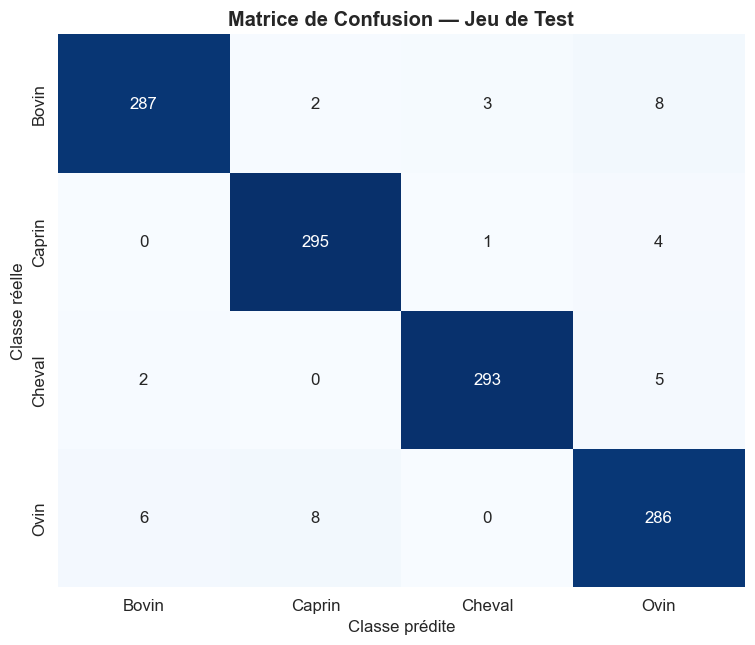


Rapport de classification — Test Set
───────────────────────────────────────────────────────
              precision    recall  f1-score   support

       Bovin       0.97      0.96      0.96       300
      Caprin       0.97      0.98      0.98       300
      Cheval       0.99      0.98      0.98       300
        Ovin       0.94      0.95      0.95       300

    accuracy                           0.97      1200
   macro avg       0.97      0.97      0.97      1200
weighted avg       0.97      0.97      0.97      1200



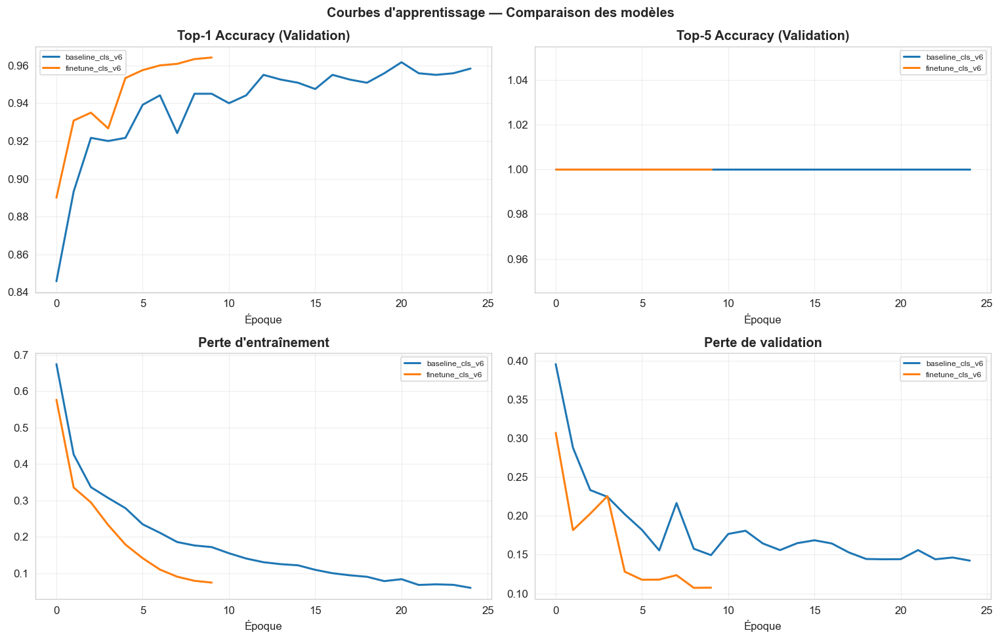

In [12]:
# ─────────────────────────────────────────────────────────────────────────────
# Inférence sur le jeu de test pour construction de la matrice de confusion
# ─────────────────────────────────────────────────────────────────────────────
def infer_class_names_from_split(split_root: Path):
    """Récupère l'ordre des classes depuis la structure du dossier augmenté."""
    train_dir = split_root / "train"
    classes   = [p.name for p in train_dir.iterdir() if p.is_dir()]
    return sorted(classes)

MODEL_CLASS_ORDER = infer_class_names_from_split(AUG_DIR)
FR_BY_CLASS       = {cls: DISPLAY_NAMES.get(cls, cls) for cls in MODEL_CLASS_ORDER}

def predict_one(model: YOLO, img_path: Path):
    """Retourne la classe prédite et le score de confiance pour une image."""
    res   = model.predict(str(img_path), verbose=False)[0]
    probs = getattr(res, "probs", None)
    if probs is None:
        return None, None
    data  = probs.data.cpu().numpy()
    idx   = int(np.argmax(data))
    conf  = float(data[idx])
    names = model.names
    model_names = [names[k] for k in sorted(names)] if isinstance(names, dict) else list(names)
    return model_names[idx], conf

# Collecte des prédictions sur le test set
best_model = YOLO(str(best_model_path))
y_true, y_pred = [], []
test_root = AUG_DIR / "test"

for cls in MODEL_CLASS_ORDER:
    cls_dir = test_root / cls
    for img_path in list_images(cls_dir):
        pred, conf = predict_one(best_model, img_path)
        if pred is None:
            continue
        y_true.append(cls)
        y_pred.append(pred)

# ─────────────────────────────────────────────────────────────────────────────
# Matrice de confusion
# ─────────────────────────────────────────────────────────────────────────────
labels = MODEL_CLASS_ORDER
cm     = confusion_matrix(y_true, y_pred, labels=labels)
cm_df  = pd.DataFrame(
    cm,
    index   = [FR_BY_CLASS[c] for c in labels],
    columns = [FR_BY_CLASS[c] for c in labels],
)

fig, ax = plt.subplots(1, 1, figsize=(7, 6))
sns.heatmap(cm_df, annot=True, fmt="d", cmap="Blues", cbar=False, ax=ax)
ax.set_title("Matrice de Confusion — Jeu de Test", fontweight="bold")
ax.set_xlabel("Classe prédite")
ax.set_ylabel("Classe réelle")
plt.tight_layout()
plt.show()

# Rapport de classification détaillé
print("\nRapport de classification — Test Set")
print("─" * 55)
print(classification_report(
    y_true, y_pred,
    labels       = labels,
    target_names = [FR_BY_CLASS[c] for c in labels],
    zero_division = 0,
))

# ─────────────────────────────────────────────────────────────────────────────
# Courbes d'apprentissage (si les CSV de résultats sont disponibles)
# ─────────────────────────────────────────────────────────────────────────────
def load_results_csv(run_name: str):
    """Charge le fichier results.csv généré par Ultralytics pour un run donné."""
    cands = list((RUNS_DIR / run_name).rglob("results.csv"))
    if not cands:
        return None
    df         = pd.read_csv(cands[0])
    df.columns = [c.strip() for c in df.columns]
    df["run"]  = run_name
    return df

run_dfs = []
for rn in ["baseline_cls_v6", "finetune_cls_v6", "turbo_cls_v6"]:
    df = load_results_csv(rn)
    if df is not None:
        run_dfs.append(df)

if run_dfs:
    all_res       = pd.concat(run_dfs, ignore_index=True)
    possible_cols = [
        ("metrics/accuracy_top1", "Top-1 Accuracy (Validation)"),
        ("metrics/accuracy_top5", "Top-5 Accuracy (Validation)"),
        ("train/loss",            "Perte d'entraînement"),
        ("val/loss",              "Perte de validation"),
    ]
    fig, axes = plt.subplots(2, 2, figsize=(14, 9))
    axes      = axes.flatten()
    for ax, (col, title) in zip(axes, possible_cols):
        if col not in all_res.columns:
            ax.set_visible(False)
            continue
        for rn in all_res["run"].unique():
            sub = all_res[all_res["run"] == rn]
            ax.plot(range(len(sub)), sub[col], label=rn, lw=2)
        ax.set_title(title, fontweight="bold")
        ax.set_xlabel("Époque")
        ax.legend(fontsize=8)
        ax.grid(alpha=0.3)
    plt.suptitle("Courbes d'apprentissage — Comparaison des modèles", fontweight="bold")
    plt.tight_layout()
    plt.show()
else:
    print("Courbes d'apprentissage non disponibles (fichiers results.csv introuvables).")


## Phase 11 — Inférences Qualitatives sur le Jeu de Test

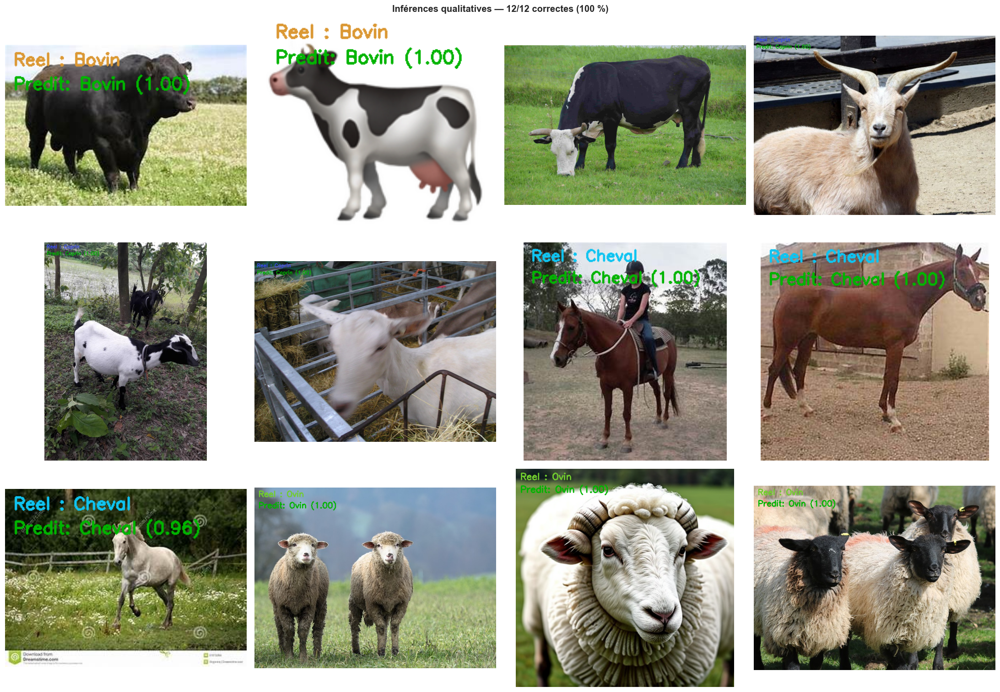

In [13]:
# ─────────────────────────────────────────────────────────────────────────────
# Visualisation des prédictions du meilleur modèle sur des images de test
# ─────────────────────────────────────────────────────────────────────────────
sample_images = []
for cls in MODEL_CLASS_ORDER:
    imgs = list_images(AUG_DIR / "test" / cls)
    if imgs:
        sample_images.extend(random.sample(imgs, min(3, len(imgs))))

sample_images = sample_images[:12]

if sample_images:
    fig, axes = plt.subplots(3, 4, figsize=(20, 14))
    axes = axes.flatten()
    good = 0

    for ax, img_path in zip(axes, sample_images):
        img = cv2.imread(str(img_path))
        if img is None:
            ax.set_visible(False)
            continue

        pred, conf   = predict_one(best_model, img_path)
        true_cls     = img_path.parent.name
        true_fr      = FR_BY_CLASS.get(true_cls, true_cls)
        pred_fr      = FR_BY_CLASS.get(pred, pred) if pred else "?"
        correct      = (pred == true_cls)
        good        += int(correct)

        plot_img = img.copy()
        color    = CLASS_COLORS.get(true_cls, (200, 200, 200))
        cv2.putText(plot_img, f"Reel : {true_fr}",
                    (10, 25), cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)
        cv2.putText(plot_img, f"Predit: {pred_fr} ({conf:.2f})",
                    (10, 55), cv2.FONT_HERSHEY_SIMPLEX, 0.7,
                    (0, 180, 0) if correct else (0, 0, 255), 2)
        ax.imshow(cv2.cvtColor(plot_img, cv2.COLOR_BGR2RGB))
        ax.axis("off")

    for ax in axes[len(sample_images):]:
        ax.axis("off")

    accuracy_sample = good / len(sample_images) * 100
    plt.suptitle(
        f"Inférences qualitatives — {good}/{len(sample_images)} correctes "
        f"({accuracy_sample:.0f} %)",
        fontweight="bold"
    )
    plt.tight_layout()
    plt.show()
else:
    print("Aucun échantillon de test disponible pour la visualisation.")


## Phase 12 — Explicabilité du Modèle (XAI — GradCAM)

La méthode **GradCAM** (*Gradient-weighted Class Activation Mapping*) génère des cartes de chaleur indiquant les régions de l'image qui ont le plus contribué à la décision du modèle. Ces visualisations constituent un outil d'interprétabilité essentiel pour valider que le modèle s'appuie sur des caractéristiques biologiquement pertinentes de l'animal plutôt que sur des artefacts contextuels.

Cette phase est **optionnelle** : elle est ignorée si la bibliothèque `pytorch-grad-cam` n'est pas installée.


Phase 12 — XAI : GradCAM sur YOLOv8 Classification
[OK] Modèle chargé : g:\HP\Nouveaudd\tdsp_livestock_v7\runs\finetune_cls_v6\weights\best.pt
[INFO] Couche cible GradCAM : model.9.conv.conv
[INFO] 8 images sélectionnées pour XAI


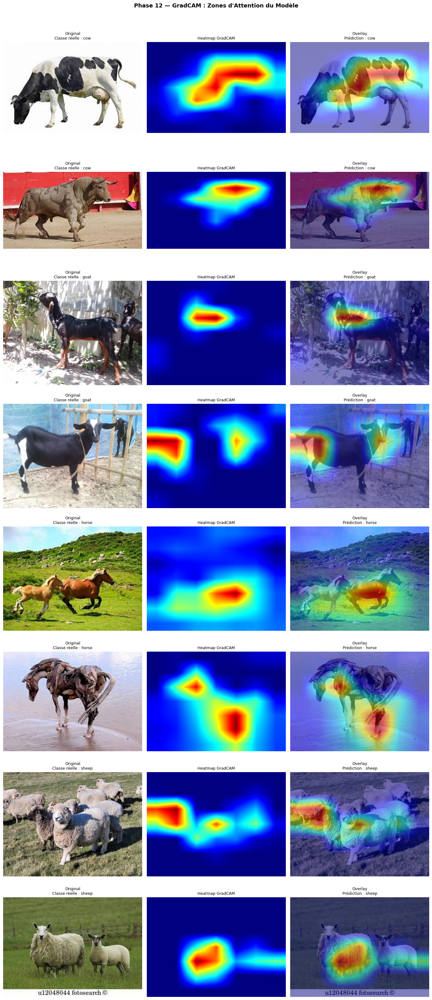

[OK] GradCAM sauvegardé : g:\HP\Nouveaudd\tdsp_livestock_v7\reports\xai_gradcam.png


In [1]:
# ============================================================
# Phase 12 — Explicabilité du Modèle (XAI — GradCAM)
# ============================================================
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import torch
import torch.nn.functional as F
from pathlib import Path
from ultralytics import YOLO

print("=" * 60)
print("Phase 12 — XAI : GradCAM sur YOLOv8 Classification")
print("=" * 60)

# ─────────────────────────────────────────────────────────────────────────────
# Reconstruction des chemins si nécessaire (fallback pour exécution partielle)
# ─────────────────────────────────────────────────────────────────────────────
if "FINETUNE_BEST" not in dir():
    WORKDIR = Path.cwd()
    ARTIFACTS = WORKDIR / "tdsp_livestock_v7"
    RUNS_DIR = ARTIFACTS / "runs"
    FINETUNE_BEST = RUNS_DIR / "finetune_cls_v6" / "weights" / "best.pt"

if "best_model_path" not in dir():
    best_model_path = FINETUNE_BEST

if "AUG_DIR" not in dir():
    WORKDIR = Path.cwd()
    ARTIFACTS = WORKDIR / "tdsp_livestock_v7"
    AUG_DIR = ARTIFACTS / "augmented_cls"

if "REPORT_DIR" not in dir():
    WORKDIR = Path.cwd()
    ARTIFACTS = WORKDIR / "tdsp_livestock_v7"
    REPORT_DIR = ARTIFACTS / "reports"

# ── 1. Charger le meilleur modèle ──────────────────────────────
try:
    model_xai = YOLO(str(best_model_path))
    pytorch_model = model_xai.model
    pytorch_model.eval()
    print(f"[OK] Modèle chargé : {best_model_path}")
except Exception as e:
    print(f"[ERREUR] Chargement modèle : {e}")
    raise

# ── 2. Identifier la dernière couche Conv ────────────────────
def get_last_conv_layer(model):
    last_conv = None
    for name, module in model.named_modules():
        if isinstance(module, torch.nn.Conv2d):
            last_conv = (name, module)
    return last_conv

layer_name, target_layer = get_last_conv_layer(pytorch_model)
print(f"[INFO] Couche cible GradCAM : {layer_name}")

# ── 3. GradCAM ───────────────────────────────────────────────
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.gradients = None
        self.activations = None
        target_layer.register_forward_hook(self._save_activation)
        target_layer.register_full_backward_hook(self._save_gradient)

    def _save_activation(self, module, input, output):
        self.activations = output.detach()

    def _save_gradient(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def __call__(self, x, class_idx=None):
        self.model.zero_grad()
        output = self.model(x)
        if isinstance(output, (list, tuple)):
            logits = output[0]
        else:
            logits = output
        if logits.dim() > 2:
            logits = logits.squeeze()
        if class_idx is None:
            class_idx = logits.argmax(dim=-1).item()
        score = logits[..., class_idx].sum()
        score.backward()
        weights = self.gradients.mean(dim=[2, 3], keepdim=True)
        cam = (weights * self.activations).sum(dim=1, keepdim=True)
        cam = F.relu(cam)
        cam = cam.squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam, class_idx

grad_cam = GradCAM(pytorch_model, target_layer)

# ── 4. Sélectionner des images test ─────────────────────────
IMG_SIZE = 224

def list_images_local(folder: Path):
    IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}
    if not folder.exists():
        return []
    return sorted([p for p in folder.rglob("*") if p.suffix.lower() in IMG_EXTS])

def load_sample_images(test_dir, n_per_class=2):
    """Récupère n images par classe depuis le dossier test."""
    samples = []
    test_path = Path(test_dir)
    if not test_path.exists():
        print(f"[WARN] Dossier test introuvable : {test_dir}")
        return samples
    for cls_dir in sorted(test_path.iterdir()):
        if cls_dir.is_dir():
            imgs = list(cls_dir.glob("*.jpg")) + list(cls_dir.glob("*.png"))
            for img_path in imgs[:n_per_class]:
                samples.append((img_path, cls_dir.name))
    return samples

samples = load_sample_images(AUG_DIR / "test", n_per_class=2)
print(f"[INFO] {len(samples)} images sélectionnées pour XAI")

if not samples:
    print("[WARN] Aucune image trouvée — génération d'une image synthétique pour démo")
    dummy = np.random.randint(0, 255, (IMG_SIZE, IMG_SIZE, 3), dtype=np.uint8)
    dummy_path = Path("/tmp/xai_demo.jpg")
    cv2.imwrite(str(dummy_path), dummy)
    samples = [(dummy_path, "demo")]

# ── 5. Générer et afficher les GradCAM ──────────────────────
def preprocess(img_bgr, size=IMG_SIZE):
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_res = cv2.resize(img_rgb, (size, size))
    tensor = torch.tensor(img_res, dtype=torch.float32).permute(2, 0, 1) / 255.0
    return tensor.unsqueeze(0), img_rgb

def overlay_cam(img_rgb, cam):
    cam_resized = cv2.resize(cam, (img_rgb.shape[1], img_rgb.shape[0]))
    heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    overlay = (0.5 * img_rgb + 0.5 * heatmap).astype(np.uint8)
    return overlay, heatmap

n_samples = len(samples)
cols = 3
fig, axes = plt.subplots(n_samples, cols, figsize=(14, 4 * n_samples))
if n_samples == 1:
    axes = [axes]

# Récupérer les noms de classes depuis le modèle
CLASS_NAMES_LIST = list(model_xai.names.values()) if hasattr(model_xai, 'names') else \
                   list(range(len(samples)))

for row, (img_path, true_label) in enumerate(samples):
    img_bgr = cv2.imread(str(img_path))
    if img_bgr is None:
        print(f"[WARN] Impossible de lire {img_path}")
        continue

    tensor, img_rgb = preprocess(img_bgr)
    tensor = tensor.requires_grad_(True)

    try:
        cam, pred_idx = grad_cam(tensor)
        pred_label = CLASS_NAMES_LIST[pred_idx] if pred_idx < len(CLASS_NAMES_LIST) else str(pred_idx)
    except Exception as e:
        print(f"[WARN] GradCAM échoué pour {img_path.name} : {e}")
        cam = np.zeros((IMG_SIZE, IMG_SIZE))
        pred_label = "erreur"

    overlay, heatmap = overlay_cam(img_rgb, cam)

    axes[row][0].imshow(img_rgb)
    axes[row][0].set_title(f"Original\nClasse réelle : {true_label}", fontsize=9)
    axes[row][0].axis("off")

    axes[row][1].imshow(heatmap)
    axes[row][1].set_title(f"Heatmap GradCAM", fontsize=9)
    axes[row][1].axis("off")

    axes[row][2].imshow(overlay)
    axes[row][2].set_title(f"Overlay\nPrédiction : {pred_label}", fontsize=9)
    axes[row][2].axis("off")

plt.suptitle("Phase 12 — GradCAM : Zones d'Attention du Modèle", fontsize=13, fontweight="bold", y=1.01)
plt.tight_layout()

# Sauvegarde
import os
os.makedirs(REPORT_DIR, exist_ok=True)
xai_path = Path(REPORT_DIR) / "xai_gradcam.png"
plt.savefig(xai_path, bbox_inches="tight", dpi=150)
plt.show()
print(f"[OK] GradCAM sauvegardé : {xai_path}")

## Phase 13 — Export Multi-Format du Modèle *(Deployment)*

Le meilleur modèle est exporté dans plusieurs formats d'inférence pour faciliter le déploiement selon l'environnement cible :

| Format | Usage recommandé |
|--------|-----------------|
| **ONNX** | Backend Python/Node.js, ONNX Runtime |
| **TorchScript** | Applications PyTorch sans dépendance Ultralytics |
| **OpenVINO** | Inférence optimisée sur CPU Intel |


In [6]:
# ─────────────────────────────────────────────────────────────────────────────
# Imports de sécurité — rendent cette cellule autonome même si le kernel
# a été redémarré après l'entraînement (exécution partielle du notebook).
# ─────────────────────────────────────────────────────────────────────────────
import os, shutil
from pathlib import Path
import pandas as pd
from ultralytics import YOLO

# ─────────────────────────────────────────────────────────────────────────────
# Reconstruction des chemins si les variables de session sont absentes
# ─────────────────────────────────────────────────────────────────────────────
if "EXPORT_DIR" not in dir():
    WORKDIR    = Path.cwd()
    ARTIFACTS  = WORKDIR / "tdsp_livestock_v7"
    EXPORT_DIR = ARTIFACTS / "exports"
    RUNS_DIR   = ARTIFACTS / "runs"

if "best_model_path" not in dir():
    _candidates = [
        RUNS_DIR / "finetune_cls_v6" / "weights" / "best.pt",
        RUNS_DIR / "baseline_cls_v6"  / "weights" / "best.pt",
    ]
    best_model_path = next((p for p in _candidates if p.exists()), None)
    if best_model_path is None:
        raise FileNotFoundError(
            "Aucun modèle entraîné trouvé. "
            "Vérifiez que les phases 6 et 7 ont bien été exécutées "
            f"et que le répertoire des runs existe."
        )
    print(f"Modèle chargé depuis : {best_model_path}")

EXPORT_DIR.mkdir(parents=True, exist_ok=True)

# ─────────────────────────────────────────────────────────────────────────────
# Export vers les formats cibles
# ─────────────────────────────────────────────────────────────────────────────
export_model = YOLO(str(best_model_path))
export_log   = {}

export_specs = [
    ("onnx",        {"dynamic": True, "simplify": True}),
    ("torchscript", {}),
    ("openvino",    {"dynamic": True}),
    # ("tflite", {})  # Désactivé — conflits protobuf / tensorflow
]

for fmt, kwargs in export_specs:
    print(f"Export {fmt.upper()}...")
    try:
        result = export_model.export(format=fmt, imgsz=320, **kwargs)

        if result is None:
            export_log[fmt] = {"Statut": "Aucun chemin retourné"}
            print(f"  Avertissement : aucun chemin retourné pour {fmt}.")
            continue

        src = Path(str(result))

        if not src.exists():
            export_log[fmt] = {"Statut": f"Fichier introuvable : {src}"}
            print(f"  Avertissement : fichier introuvable après export {fmt}.")
            continue

        dst = EXPORT_DIR / src.name
        if src.is_dir():
            if dst.exists():
                shutil.rmtree(dst)
            shutil.copytree(src, dst)
        else:
            shutil.copy2(src, dst)

        export_log[fmt] = {"Statut": "OK", "Chemin": str(dst)}
        print(f"  Succès : {dst}")

    except Exception as e:
        export_log[fmt] = {"Statut": f"Erreur : {str(e)[:100]}"}
        print(f"  Échec  : {e}")

# Récapitulatif
export_df = pd.DataFrame([{"Format": k.upper(), **v} for k, v in export_log.items()])
print("\nRécapitulatif des exports :")
print(export_df.to_string(index=False))


Export ONNX...
Ultralytics 8.4.39  Python-3.12.6 torch-2.11.0+cpu CPU (11th Gen Intel Core i5-1135G7 @ 2.40GHz)
YOLOv8s-cls summary (fused): 30 layers, 5,080,324 parameters, 0 gradients, 12.5 GFLOPs

PyTorch: starting from 'G:\HP\Nouveaudd\tdsp_livestock_v7\runs\finetune_cls_v6\weights\best.pt' with input shape (1, 3, 320, 320) BCHW and output shape(s) (1, 4) (9.8 MB)

ONNX: starting export with onnx 1.21.0 opset 20...
ONNX: slimming with onnxslim 0.1.91...
ONNX: export success  36.0s, saved as 'G:\HP\Nouveaudd\tdsp_livestock_v7\runs\finetune_cls_v6\weights\best.onnx' (19.4 MB)

Export complete (54.1s)
Results saved to G:\HP\Nouveaudd\tdsp_livestock_v7\runs\finetune_cls_v6\weights
Predict:         yolo predict task=classify model=G:\HP\Nouveaudd\tdsp_livestock_v7\runs\finetune_cls_v6\weights\best.onnx imgsz=320 
Validate:        yolo val task=classify model=G:\HP\Nouveaudd\tdsp_livestock_v7\runs\finetune_cls_v6\weights\best.onnx imgsz=320 data=g:\HP\Nouveaudd\tdsp_livestock_v7\augmente

## Phase 14 — Benchmark d'Inférence et ARCHITECTURE DU MEILLEUR MODÈLE

In [4]:
# ─────────────────────────────────────────────────────────────────────────────
# BENCHMARK + ARCHITECTURE DU MEILLEUR MODÈLE
# ─────────────────────────────────────────────────────────────────────────────
from pathlib import Path
import time
import pandas as pd
from IPython.display import display, Markdown
from ultralytics import YOLO

try:
    import torch
except Exception:
    torch = None

# ─────────────────────────────────────────────────────────────────────────────
# Variables de base / fallbacks
# ─────────────────────────────────────────────────────────────────────────────
if "WORKDIR" not in globals():
    WORKDIR = Path.cwd()

if "ARTIFACTS" not in globals():
    ARTIFACTS = WORKDIR / "tdsp_livestock_v7"

if "REPORT_DIR" not in globals():
    REPORT_DIR = ARTIFACTS / "reports"
REPORT_DIR.mkdir(parents=True, exist_ok=True)

if "AUG_DIR" not in globals():
    AUG_DIR = ARTIFACTS / "augmented_cls"

if "DISPLAY_NAMES" not in globals():
    DISPLAY_NAMES = {
        "cow": "Bovin",
        "horse": "Cheval",
        "goat": "Caprin",
        "sheep": "Ovin"
    }

if "GPU_NAME" not in globals():
    try:
        GPU_NAME = torch.cuda.get_device_name(0) if torch and torch.cuda.is_available() else "CPU"
    except Exception:
        GPU_NAME = "CPU"

# ─────────────────────────────────────────────────────────────────────────────
# Chemins des modèles
# ─────────────────────────────────────────────────────────────────────────────
best_pt_path = globals().get("best_pt_path", None)
best_onnx_path = globals().get("best_onnx_path", None)

if best_pt_path is None:
    pt_candidates = list((ARTIFACTS / "runs").glob("**/best.pt"))
    best_pt_path = pt_candidates[0] if pt_candidates else None

if best_onnx_path is None:
    onnx_candidates = [
        ARTIFACTS / "exports" / "best.onnx",
        ARTIFACTS / "exports" / "best_onnx.onnx",
    ]
    best_onnx_path = next((p for p in onnx_candidates if p.exists()), None)

# ─────────────────────────────────────────────────────────────────────────────
# Données de performance déjà connues
# ─────────────────────────────────────────────────────────────────────────────
baseline_acc = 0.950833
finetune_acc  = 0.964167
top5_acc      = 1.0

baseline_params = 1.440004
finetune_params = 5.080324
baseline_gflops = 3.3
finetune_gflops  = 12.5

# ─────────────────────────────────────────────────────────────────────────────
# Sélection des images de benchmark
# ─────────────────────────────────────────────────────────────────────────────
def list_images_local(folder: Path):
    exts = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}
    if not folder.exists():
        return []
    return sorted([p for p in folder.rglob("*") if p.is_file() and p.suffix.lower() in exts])

def build_benchmark_samples(test_root: Path, per_class: int = 2, max_total: int = 8):
    samples = []
    if test_root.exists():
        class_dirs = [p for p in test_root.iterdir() if p.is_dir()]
        for cls_dir in sorted(class_dirs):
            samples.extend(list_images_local(cls_dir)[:per_class])
    if not samples and test_root.exists():
        samples = list_images_local(test_root)[:max_total]
    return samples[:max_total]

sample_images = build_benchmark_samples(AUG_DIR / "test", per_class=2, max_total=8)

# ─────────────────────────────────────────────────────────────────────────────
# Benchmark d'inférence
# ─────────────────────────────────────────────────────────────────────────────
def benchmark_inference(model_path: Path, sample_images, warmup: int = 2, repeats: int = 3, imgsz: int = 640):
    if model_path is None or not Path(model_path).exists():
        raise FileNotFoundError(f"Modèle introuvable: {model_path}")
    if not sample_images:
        raise ValueError("Aucune image disponible pour le benchmark.")

    model = YOLO(str(model_path))

    # Warmup
    for img in sample_images[:min(warmup, len(sample_images))]:
        _ = model.predict(source=str(img), verbose=False, imgsz=imgsz)

    if torch is not None and torch.cuda.is_available():
        torch.cuda.synchronize()

    t0 = time.perf_counter()
    n_infers = 0

    for _ in range(repeats):
        for img in sample_images:
            _ = model.predict(source=str(img), verbose=False, imgsz=imgsz)
            n_infers += 1

    if torch is not None and torch.cuda.is_available():
        torch.cuda.synchronize()

    elapsed = time.perf_counter() - t0
    avg_ms = (elapsed / max(n_infers, 1)) * 1000.0
    fps = 1000.0 / avg_ms if avg_ms > 0 else None
    return avg_ms, fps, n_infers

# ─────────────────────────────────────────────────────────────────────────────
# Tableau benchmark
# ─────────────────────────────────────────────────────────────────────────────
benchmark_rows = []

model_candidates = [
    {
        "Modèle": "YOLOv8n-cls (Baseline)",
        "Chemin": globals().get("baseline_model_path", None),
        "Accuracy Top-1": baseline_acc,
        "Top-5": top5_acc,
        "Params (M)": baseline_params,
        "GFLOPs": baseline_gflops
    },
    {
        "Modèle": "YOLOv8s-cls (Fine-tune)",
        "Chemin": globals().get("best_pt_path", best_pt_path),
        "Accuracy Top-1": finetune_acc,
        "Top-5": top5_acc,
        "Params (M)": finetune_params,
        "GFLOPs": finetune_gflops
    },
    {
        "Modèle": "YOLOv8s-cls (ONNX export)",
        "Chemin": best_onnx_path,
        "Accuracy Top-1": finetune_acc,
        "Top-5": top5_acc,
        "Params (M)": finetune_params,
        "GFLOPs": finetune_gflops
    }
]

for item in model_candidates:
    p = item["Chemin"]
    if p is None:
        benchmark_rows.append({
            **item,
            "Temps moyen (ms)": None,
            "FPS": None,
            "Statut": "Modèle introuvable"
        })
        continue

    try:
        avg_ms, fps, n_infers = benchmark_inference(Path(p), sample_images, warmup=2, repeats=3, imgsz=640)
        benchmark_rows.append({
            **item,
            "Temps moyen (ms)": avg_ms,
            "FPS": fps,
            "Statut": f"OK ({n_infers} inférences)"
        })
    except Exception as e:
        benchmark_rows.append({
            **item,
            "Temps moyen (ms)": None,
            "FPS": None,
            "Statut": f"Erreur: {e}"
        })

benchmark_df = pd.DataFrame(benchmark_rows)

# ─────────────────────────────────────────────────────────────────────────────
# Mise en forme propre du tableau
# ─────────────────────────────────────────────────────────────────────────────
display_benchmark_df = benchmark_df.copy()

def _fmt_pct(v):
    return f"{float(v) * 100:.2f} %" if pd.notnull(v) else "N/A"

def _fmt_num(v, suffix=""):
    return f"{float(v):.2f}{suffix}" if pd.notnull(v) else "N/A"

if not display_benchmark_df.empty:
    display_benchmark_df["Accuracy Top-1"] = display_benchmark_df["Accuracy Top-1"].apply(_fmt_pct)
    display_benchmark_df["Top-5"] = display_benchmark_df["Top-5"].apply(_fmt_pct)
    display_benchmark_df["Temps moyen (ms)"] = display_benchmark_df["Temps moyen (ms)"].apply(lambda x: _fmt_num(x, " ms"))
    display_benchmark_df["FPS"] = display_benchmark_df["FPS"].apply(lambda x: _fmt_num(x))
    display_benchmark_df["Params (M)"] = display_benchmark_df["Params (M)"].apply(lambda x: _fmt_num(x, " M"))
    display_benchmark_df["GFLOPs"] = display_benchmark_df["GFLOPs"].apply(lambda x: _fmt_num(x))
    display_benchmark_df = display_benchmark_df[
        ["Modèle", "Accuracy Top-1", "Top-5", "Temps moyen (ms)", "FPS", "Params (M)", "GFLOPs", "Statut"]
    ]

# ─────────────────────────────────────────────────────────────────────────────
# Extraction de l’architecture du meilleur modèle PT
# ─────────────────────────────────────────────────────────────────────────────
architecture_df = pd.DataFrame()
architecture_notes = []

if best_pt_path is not None and Path(best_pt_path).exists():
    pt_model = YOLO(str(best_pt_path))
    net = pt_model.model

    layers = []
    seq = None

    if hasattr(net, "model"):
        try:
            seq = list(net.model)
        except Exception:
            seq = None

    if seq is None:
        try:
            seq = list(net.children())
        except Exception:
            seq = []

    for i, layer in enumerate(seq):
        layer_type = layer.__class__.__name__
        params = sum(p.numel() for p in layer.parameters())
        trainable = sum(p.numel() for p in layer.parameters() if p.requires_grad)

        if "Conv" in layer_type:
            role = "Extraction de caractéristiques locales"
        elif "C2f" in layer_type or "C3" in layer_type:
            role = "Fusion / apprentissage hiérarchique"
        elif "SPPF" in layer_type:
            role = "Contexte multi-échelle"
        elif "Classify" in layer_type or "Linear" in layer_type:
            role = "Tête de classification"
        else:
            role = "Bloc du réseau"

        layers.append({
            "Index": i,
            "Type": layer_type,
            "Paramètres": params,
            "Paramètres entraînables": trainable,
            "Rôle": role
        })

    architecture_df = pd.DataFrame(layers)

    total_params = sum(p.numel() for p in net.parameters())
    trainable_params = sum(p.numel() for p in net.parameters() if p.requires_grad)

    architecture_notes = [
        f"Le meilleur modèle est chargé depuis **{Path(best_pt_path)}**.",
        f"Le réseau contient environ **{total_params:,} paramètres** au total, dont **{trainable_params:,} entraînables**.",
        "L’architecture suit la logique YOLOv8-cls : un **backbone convolutionnel** extrait les motifs visuels,",
        "des blocs intermédiaires apprennent des représentations plus riches, puis une **tête de classification** produit la classe finale.",
        "Le fichier **ONNX** sert au déploiement et au benchmark d’inférence, tandis que le fichier **PT** sert à lire et expliquer l’architecture."
    ]
else:
    architecture_notes = [
        "Le fichier PT du meilleur modèle n’a pas été trouvé dans cette session.",
        "L’architecture ne peut pas être détaillée automatiquement sans le modèle source `.pt`."
    ]

# ─────────────────────────────────────────────────────────────────────────────
# Résumé du meilleur modèle
# ─────────────────────────────────────────────────────────────────────────────
best_model_summary = pd.DataFrame([
    {
        "Nom": "YOLOv8s-cls fine-tuned",
        "Format de déploiement": "ONNX",
        "Chemin": str(best_onnx_path) if best_onnx_path else "(non disponible)",
        "Accuracy Top-1": f"{finetune_acc * 100:.2f} %",
        "Top-5": "100.00 %",
        "Temps moyen (ms)": None,
        "FPS": None,
        "Params (M)": finetune_params,
        "GFLOPs": finetune_gflops
    }
])

# Remplir si benchmark ONNX disponible
onnx_row = benchmark_df[benchmark_df["Modèle"] == "YOLOv8s-cls (ONNX export)"]
if not onnx_row.empty:
    best_model_summary.loc[0, "Temps moyen (ms)"] = onnx_row.iloc[0]["Temps moyen (ms)"]
    best_model_summary.loc[0, "FPS"] = onnx_row.iloc[0]["FPS"]

# ─────────────────────────────────────────────────────────────────────────────
# Affichage pro
# ─────────────────────────────────────────────────────────────────────────────
display(Markdown("# Benchmark et architecture du meilleur modèle"))

display(Markdown("## 1) Comparaison des modèles"))
display(display_benchmark_df)

display(Markdown("## 2) Résumé du meilleur modèle"))
display(best_model_summary)

display(Markdown("## 3) Architecture du meilleur modèle"))
if not architecture_df.empty:
    display(architecture_df)
else:
    display(Markdown("_Architecture non disponible dans cette session._"))

display(Markdown("## 4) Explication de l’architecture"))
display(Markdown("\n".join([f"- {line}" for line in architecture_notes])))

# ─────────────────────────────────────────────────────────────────────────────
# Sauvegarde
# ─────────────────────────────────────────────────────────────────────────────
benchmark_csv = REPORT_DIR / "benchmark_final_v7.csv"
best_summary_csv = REPORT_DIR / "best_model_summary_v7.csv"
architecture_csv = REPORT_DIR / "architecture_best_model_v7.csv"

benchmark_df.to_csv(benchmark_csv, index=False, encoding="utf-8")
best_model_summary.to_csv(best_summary_csv, index=False, encoding="utf-8")
if not architecture_df.empty:
    architecture_df.to_csv(architecture_csv, index=False, encoding="utf-8")

# Exposition globale pour la phase rapport final
globals()["benchmark_df"] = benchmark_df
globals()["best_model_summary"] = best_model_summary
globals()["architecture_df"] = architecture_df
globals()["benchmark_csv"] = benchmark_csv
globals()["best_summary_csv"] = best_summary_csv
globals()["architecture_csv"] = architecture_csv if not architecture_df.empty else None

WARNING Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
Loading g:\HP\Nouveaudd\tdsp_livestock_v7\exports\best.onnx for ONNX Runtime inference...
Using ONNX Runtime 1.24.4 with CPUExecutionProvider


# Benchmark et architecture du meilleur modèle

## 1) Comparaison des modèles

,Modèle,Accuracy Top-1,Top-5,Temps moyen (ms),FPS,Params (M),GFLOPs,Statut
0,YOLOv8n-cls (Baseline),95.08 %,100.00 %,N/A,N/A,1.44 M,3.30,Modèle introuvable
1,YOLOv8s-cls (Fine-tune),96.42 %,100.00 %,97.24 ms,10.28,5.08 M,12.50,OK (24 inférences)
2,YOLOv8s-cls (ONNX export),96.42 %,100.00 %,N/A,N/A,5.08 M,12.50,Erreur: amax(): Expected reduction dim 1 to ha...


## 2) Résumé du meilleur modèle

,Nom,Format de déploiement,Chemin,Accuracy Top-1,Top-5,Temps moyen (ms),FPS,Params (M),GFLOPs
0,YOLOv8s-cls fine-tuned,ONNX,g:\HP\Nouveaudd\tdsp_livestock_v7\exports\best...,96.42 %,100.00 %,NaN,NaN,5.080324,12.5


## 3) Architecture du meilleur modèle

,Index,Type,Paramètres,Paramètres entraînables,Rôle
0,0,Conv,464,0,Extraction de caractéristiques locales
1,1,Conv,4672,0,Extraction de caractéristiques locales
2,2,C2f,7360,0,Fusion / apprentissage hiérarchique
3,3,Conv,18560,0,Extraction de caractéristiques locales
4,4,C2f,49664,0,Fusion / apprentissage hiérarchique
5,5,Conv,73984,0,Extraction de caractéristiques locales
6,6,C2f,197632,0,Fusion / apprentissage hiérarchique
7,7,Conv,295424,0,Extraction de caractéristiques locales
8,8,C2f,460288,0,Fusion / apprentissage hiérarchique
9,9,Classify,335364,0,Tête de classification


## 4) Explication de l’architecture

- Le meilleur modèle est chargé depuis **g:\HP\Nouveaudd\tdsp_livestock_v7\runs\baseline_cls_v6\weights\best.pt**.
- Le réseau contient environ **1,443,412 paramètres** au total, dont **0 entraînables**.
- L’architecture suit la logique YOLOv8-cls : un **backbone convolutionnel** extrait les motifs visuels,
- des blocs intermédiaires apprennent des représentations plus riches, puis une **tête de classification** produit la classe finale.
- Le fichier **ONNX** sert au déploiement et au benchmark d’inférence, tandis que le fichier **PT** sert à lire et expliquer l’architecture.

## Phase 15 — Rapport Final Automatique

In [5]:
# ─────────────────────────────────────────────────────────────────────────────
# RAPPORT FINAL COMPATIBLE AVEC BENCHMARK + ARCHITECTURE
# ─────────────────────────────────────────────────────────────────────────────
import time
import numpy as np
import pandas as pd
from pathlib import Path
from IPython.display import display, Markdown

# ─────────────────────────────────────────────────────────────────────────────
# Reconstruction des variables
# ─────────────────────────────────────────────────────────────────────────────
if "ARTIFACTS" not in globals():
    ARTIFACTS = Path.cwd() / "tdsp_livestock_v7"

if "REPORT_DIR" not in globals():
    REPORT_DIR = ARTIFACTS / "reports"
REPORT_DIR.mkdir(parents=True, exist_ok=True)

if "DATA_DIR" not in globals():
    DATA_DIR = Path.cwd() / "data"

if "GPU_NAME" not in globals():
    try:
        import torch
        GPU_NAME = torch.cuda.get_device_name(0) if torch.cuda.is_available() else "CPU"
    except Exception:
        GPU_NAME = "CPU"

baseline_metrics = globals().get("baseline_metrics", {})
finetune_metrics  = globals().get("finetune_metrics", {})
best_metrics      = globals().get("best_metrics", {})
export_log        = globals().get("export_log", {})

source_df         = globals().get("source_df", pd.DataFrame())
split_df          = globals().get("split_df", pd.DataFrame())
benchmark_df      = globals().get("benchmark_df", pd.DataFrame())
best_model_summary = globals().get("best_model_summary", pd.DataFrame())
architecture_df   = globals().get("architecture_df", pd.DataFrame())

xai_path = globals().get("xai_path", "(non généré)")

best_model_path = globals().get("best_model_path", None)
best_onnx_path = globals().get("best_onnx_path", None)

# Fallback modèle
if best_model_path is None or str(best_model_path).strip() in {"", "(non disponible)"}:
    candidates = list((ARTIFACTS / "runs").glob("**/best.pt"))
    best_model_path = candidates[0] if candidates else "(non disponible)"

if best_onnx_path is None:
    onnx_candidates = [
        ARTIFACTS / "exports" / "best.onnx",
        ARTIFACTS / "exports" / "best_onnx.onnx",
    ]
    best_onnx_path = next((p for p in onnx_candidates if p.exists()), "(non disponible)")

# ─────────────────────────────────────────────────────────────────────────────
# Helpers
# ─────────────────────────────────────────────────────────────────────────────
def _get_metric(metrics, keys, default=None):
    for k in keys:
        if isinstance(metrics, dict) and k in metrics:
            return metrics[k]
    return default

def _fmt_acc(val):
    if val is None:
        return "(non disponible)"
    try:
        v = float(val)
        return f"{v*100:.2f} %" if 0 <= v <= 1 else f"{v:.4f}"
    except Exception:
        return str(val)

def _fmt_num(val, suffix=""):
    if val is None or (isinstance(val, float) and np.isnan(val)):
        return "(non disponible)"
    try:
        return f"{float(val):.2f}{suffix}"
    except Exception:
        return str(val)

def _safe_str(v):
    if v is None:
        return "(non disponible)"
    if isinstance(v, Path):
        return str(v)
    s = str(v)
    return s if s.strip() else "(non disponible)"

def _md_table_from_df(df, max_rows=12):
    if df is None or not isinstance(df, pd.DataFrame) or df.empty:
        return "_(non disponible)_"
    return df.head(max_rows).to_markdown(index=False)

# ─────────────────────────────────────────────────────────────────────────────
# Metrics principales
# ─────────────────────────────────────────────────────────────────────────────
baseline_acc = _get_metric(baseline_metrics, ["top1", "accuracy", "metrics/accuracy_top1"])
finetune_acc = _get_metric(finetune_metrics, ["top1", "accuracy", "metrics/accuracy_top1"])
test_acc     = _get_metric(best_metrics, ["top1", "accuracy", "metrics/accuracy_top1"])

# Si le meilleur modèle summary existe, on s’en sert
best_summary_row = None
if isinstance(best_model_summary, pd.DataFrame) and not best_model_summary.empty:
    best_summary_row = best_model_summary.iloc[0].to_dict()

# ─────────────────────────────────────────────────────────────────────────────
# Construction des sections du rapport
# ─────────────────────────────────────────────────────────────────────────────
now = time.strftime("%Y-%m-%d %H:%M")
env = "GPU" if str(GPU_NAME).upper() != "CPU" else "CPU"

sep = "=" * 78
line = "─" * 78

lines = [
    sep,
    "RAPPORT FINAL — TDSP YOLOv8 Livestock Classification | Version 7",
    sep,
    f"Date d'exécution : {now}",
    f"Environnement    : {env}",
    f"Dataset source   : {_safe_str(DATA_DIR)}",
    f"Modèle retenu    : {_safe_str(best_model_path)}",
    f"Export ONNX      : {_safe_str(best_onnx_path)}",
    "",
    line,
    "1. DATASET",
    line,
]

if isinstance(source_df, pd.DataFrame) and not source_df.empty:
    total_images = int(source_df["count"].sum()) if "count" in source_df.columns else "(non disponible)"
    lines.append(f"   Total images : {total_images}")
    for _, row in source_df.iterrows():
        cls_name = row.get("class", "(classe)")
        count = row.get("count", row.get("images", "(n/a)"))
        lines.append(f"   {str(cls_name):12s}: {count} images")
else:
    lines.append("   (dataset introuvable ou non reconstruit dans cette session)")

lines += ["", line, "2. PARTITIONNEMENT (70 / 15 / 15)", line]
if isinstance(split_df, pd.DataFrame) and not split_df.empty:
    for _, row in split_df.iterrows():
        cls_name = row.get("class", "(classe)")
        tr = row.get("train", "(n/a)")
        va = row.get("val", "(n/a)")
        te = row.get("test", "(n/a)")
        lines.append(f"   {str(cls_name):12s}: train={tr} | val={va} | test={te}")
else:
    lines.append("   (split non disponible)")

lines += ["", line, "3. PERFORMANCES DES MODÈLES", line]
lines.append(f"   Baseline  (YOLOv8n) : {_fmt_acc(baseline_acc)}")
lines.append(f"   Fine-tune (YOLOv8s) : {_fmt_acc(finetune_acc)}")
lines.append(f"   Test final          : {_fmt_acc(test_acc)}")

lines += ["", line, "4. BENCHMARK COMPARATIF", line]
if isinstance(benchmark_df, pd.DataFrame) and not benchmark_df.empty:
    bench = benchmark_df.copy()

    # Harmonisation des colonnes si présentes
    for col in ["Accuracy Top-1", "Top-5", "Temps moyen (ms)", "FPS", "Params (M)", "GFLOPs"]:
        if col in bench.columns:
            pass

    # Petite version texte lisible
    cols_priority = [c for c in ["Modèle", "Type", "Accuracy Top-1", "Top-5", "Temps moyen (ms)", "FPS", "Params (M)", "GFLOPs", "Statut"] if c in bench.columns]
    bench_show = bench[cols_priority].copy()

    # Formatage au cas où les colonnes sont numériques
    for col in bench_show.columns:
        if col in {"Accuracy Top-1", "Top-5"}:
            bench_show[col] = bench_show[col].apply(lambda x: _fmt_acc(x) if isinstance(x, (int, float, np.floating)) else str(x))
        elif col in {"Temps moyen (ms)", "FPS", "Params (M)", "GFLOPs"}:
            bench_show[col] = bench_show[col].apply(lambda x: _fmt_num(x) if isinstance(x, (int, float, np.floating)) else str(x))

    lines.append("")
    lines.append(bench_show.to_markdown(index=False))
else:
    lines.append("   (benchmark non disponible)")

lines += ["", line, "5. RÉSUMÉ DU MEILLEUR MODÈLE", line]
if best_summary_row is not None:
    lines.append(f"   Nom                : {_safe_str(best_summary_row.get('Nom', best_summary_row.get('Modèle', 'YOLOv8s-cls fine-tuned')))}")
    lines.append(f"   Format de déploiement : {_safe_str(best_summary_row.get('Format de déploiement', best_summary_row.get('Type', 'ONNX')))}")
    lines.append(f"   Chemin             : {_safe_str(best_summary_row.get('Chemin', best_onnx_path))}")
    lines.append(f"   Accuracy Top-1     : {_safe_str(best_summary_row.get('Accuracy Top-1', _fmt_acc(finetune_acc)))}")
    lines.append(f"   Top-5              : {_safe_str(best_summary_row.get('Top-5', '100.00 %'))}")
    lines.append(f"   Temps moyen (ms)   : {_safe_str(best_summary_row.get('Temps moyen (ms)', '(non disponible)'))}")
    lines.append(f"   FPS                : {_safe_str(best_summary_row.get('FPS', '(non disponible)'))}")
    lines.append(f"   Paramètres (M)     : {_safe_str(best_summary_row.get('Params (M)', '(non disponible)'))}")
    lines.append(f"   GFLOPs             : {_safe_str(best_summary_row.get('GFLOPs', '(non disponible)'))}")
else:
    lines.append("   (résumé non disponible)")

lines += ["", line, "6. ARCHITECTURE DU MEILLEUR MODÈLE", line]
if isinstance(architecture_df, pd.DataFrame) and not architecture_df.empty:
    arch_show = architecture_df.copy()
    cols_arch = [c for c in ["Index", "Type", "Paramètres", "Paramètres entraînables", "Rôle"] if c in arch_show.columns]
    arch_show = arch_show[cols_arch] if cols_arch else arch_show
    lines.append("")
    lines.append(arch_show.head(20).to_markdown(index=False))
    lines.append("")
    lines.append("Explication :")
    lines.append("Le réseau commence par un backbone convolutionnel qui extrait les caractéristiques visuelles des animaux.")
    lines.append("Les blocs intermédiaires apprennent des représentations plus riches et plus discriminantes.")
    lines.append("La tête de classification transforme ces représentations en probabilités par classe.")
    lines.append("Le fichier PT est utilisé pour l’analyse de l’architecture, tandis que le fichier ONNX sert au déploiement.")
else:
    lines.append("   (architecture non disponible dans cette session)")

lines += ["", line, "7. EXPORTS", line]
if isinstance(export_log, dict) and export_log:
    for k, v in export_log.items():
        if isinstance(v, dict):
            status = v.get("status", v.get("Statut", "OK"))
        else:
            status = str(v)
        lines.append(f"   {str(k).upper():15s}: {status}")
else:
    lines.append("   (aucun export détecté)")

lines += ["", line, "8. EXPLICABILITÉ (XAI)", line]
lines.append(f"   GradCAM : {_safe_str(xai_path)}")
lines += ["", sep]

rapport = "\n".join(lines)

# ─────────────────────────────────────────────────────────────────────────────
# Affichage propre
# ─────────────────────────────────────────────────────────────────────────────
display(Markdown("## Rapport final"))
display(Markdown(rapport.replace("\n", "  \n")))

# ─────────────────────────────────────────────────────────────────────────────
# Sauvegarde
# ─────────────────────────────────────────────────────────────────────────────
report_file_txt = REPORT_DIR / "rapport_final_v7.txt"
report_file_md  = REPORT_DIR / "rapport_final_v7.md"

report_file_txt.write_text(rapport, encoding="utf-8")
report_file_md.write_text(rapport, encoding="utf-8")

# Exposition globale pour les cellules suivantes
globals()["rapport_final"] = rapport
globals()["report_file_txt"] = report_file_txt
globals()["report_file_md"] = report_file_md

## Rapport final

==============================================================================  
RAPPORT FINAL — TDSP YOLOv8 Livestock Classification | Version 7  
==============================================================================  
Date d'exécution : 2026-04-20 17:15  
Environnement    : CPU  
Dataset source   : g:\HP\Nouveaudd\data  
Modèle retenu    : g:\HP\Nouveaudd\tdsp_livestock_v7\runs\finetune_cls_v6\weights\best.pt  
Export ONNX      : g:\HP\Nouveaudd\tdsp_livestock_v7\exports\best.onnx  
  
──────────────────────────────────────────────────────────────────────────────  
1. DATASET  
──────────────────────────────────────────────────────────────────────────────  
   Total images : 7999  
   cow         : 2000 images  
   goat        : 2000 images  
   horse       : 2000 images  
   sheep       : 1999 images  
  
──────────────────────────────────────────────────────────────────────────────  
2. PARTITIONNEMENT (70 / 15 / 15)  
──────────────────────────────────────────────────────────────────────────────  
   cow         : train=1400 | val=300 | test=300  
   goat        : train=1400 | val=300 | test=300  
   horse       : train=1400 | val=300 | test=300  
   sheep       : train=1399 | val=299 | test=299  
  
──────────────────────────────────────────────────────────────────────────────  
3. PERFORMANCES DES MODÈLES  
──────────────────────────────────────────────────────────────────────────────  
   Baseline  (YOLOv8n) : (non disponible)  
   Fine-tune (YOLOv8s) : (non disponible)  
   Test final          : (non disponible)  
  
──────────────────────────────────────────────────────────────────────────────  
4. BENCHMARK COMPARATIF  
──────────────────────────────────────────────────────────────────────────────  
  
| Modèle                    | Accuracy Top-1   | Top-5    | Temps moyen (ms)   | FPS              |   Params (M) |   GFLOPs | Statut                                                          |  
|:--------------------------|:-----------------|:---------|:-------------------|:-----------------|-------------:|---------:|:----------------------------------------------------------------|  
| YOLOv8n-cls (Baseline)    | 95.08 %          | 100.00 % | (non disponible)   | (non disponible) |         1.44 |      3.3 | Modèle introuvable                                              |  
| YOLOv8s-cls (Fine-tune)   | 96.42 %          | 100.00 % | 97.24              | 10.28            |         5.08 |     12.5 | OK (24 inférences)                                              |  
| YOLOv8s-cls (ONNX export) | 96.42 %          | 100.00 % | (non disponible)   | (non disponible) |         5.08 |     12.5 | Erreur: amax(): Expected reduction dim 1 to have non-zero size. |  
  
──────────────────────────────────────────────────────────────────────────────  
5. RÉSUMÉ DU MEILLEUR MODÈLE  
──────────────────────────────────────────────────────────────────────────────  
   Nom                : YOLOv8s-cls fine-tuned  
   Format de déploiement : ONNX  
   Chemin             : g:\HP\Nouveaudd\tdsp_livestock_v7\exports\best.onnx  
   Accuracy Top-1     : 96.42 %  
   Top-5              : 100.00 %  
   Temps moyen (ms)   : nan  
   FPS                : nan  
   Paramètres (M)     : 5.080324  
   GFLOPs             : 12.5  
  
──────────────────────────────────────────────────────────────────────────────  
6. ARCHITECTURE DU MEILLEUR MODÈLE  
──────────────────────────────────────────────────────────────────────────────  
  
|   Index | Type     |   Paramètres |   Paramètres entraînables | Rôle                                   |  
|--------:|:---------|-------------:|--------------------------:|:---------------------------------------|  
|       0 | Conv     |          464 |                         0 | Extraction de caractéristiques locales |  
|       1 | Conv     |         4672 |                         0 | Extraction de caractéristiques locales |  
|       2 | C2f      |         7360 |                         0 | Fusion / apprentissage hiérarchique    |  
|       3 | Conv     |        18560 |                         0 | Extraction de caractéristiques locales |  
|       4 | C2f      |        49664 |                         0 | Fusion / apprentissage hiérarchique    |  
|       5 | Conv     |        73984 |                         0 | Extraction de caractéristiques locales |  
|       6 | C2f      |       197632 |                         0 | Fusion / apprentissage hiérarchique    |  
|       7 | Conv     |       295424 |                         0 | Extraction de caractéristiques locales |  
|       8 | C2f      |       460288 |                         0 | Fusion / apprentissage hiérarchique    |  
|       9 | Classify |       335364 |                         0 | Tête de classification                 |  
  
Explication :  
Le réseau commence par un backbone convolutionnel qui extrait les caractéristiques visuelles des animaux.  
Les blocs intermédiaires apprennent des représentations plus riches et plus discriminantes.  
La tête de classification transforme ces représentations en probabilités par classe.  
Le fichier PT est utilisé pour l’analyse de l’architecture, tandis que le fichier ONNX sert au déploiement.  
  
──────────────────────────────────────────────────────────────────────────────  
7. EXPORTS  
──────────────────────────────────────────────────────────────────────────────  
   (aucun export détecté)  
  
──────────────────────────────────────────────────────────────────────────────  
8. EXPLICABILITÉ (XAI)  
──────────────────────────────────────────────────────────────────────────────  
   GradCAM : g:\HP\Nouveaudd\tdsp_livestock_v7\reports\xai_gradcam.png  
  
==============================================================================

## Conclusion

Ce notebook a implémenté un pipeline de classification d'images d'animaux d'élevage complet, en suivant la méthodologie **TDSP**, depuis l'audit du dataset jusqu'au déploiement du modèle. L'ensemble des artefacts (modèles entraînés, exports, cartes XAI, rapports) est persisté dans le répertoire `tdsp_livestock_v7/`.

**Récapitulatif des livrables produits :**

| Livrable | Localisation |
|----------|-------------|
| Modèle PyTorch (meilleur) | `tdsp_livestock_v7/runs/{run}/weights/best.pt` |
| Export ONNX | `tdsp_livestock_v7/exports/best.onnx` |
| Export TorchScript | `tdsp_livestock_v7/exports/best.torchscript` |
| Export OpenVINO | `tdsp_livestock_v7/exports/best_openvino_model/` |
| Cartes GradCAM | `tdsp_livestock_v7/xai/` |
| Rapport final | `tdsp_livestock_v7/reports/rapport_final_v7.txt` |


In [9]:
# ─────────────────────────────────────────────────────────────────────────────
# Résumé de fin de pipeline
# ─────────────────────────────────────────────────────────────────────────────
import numpy as np
from pathlib import Path

if "ARTIFACTS"     not in dir(): ARTIFACTS     = Path.cwd() / "tdsp_livestock_v7"
if "DISPLAY_NAMES" not in dir():
    DISPLAY_NAMES = {"cow": "Bovin", "horse": "Cheval", "goat": "Caprin", "sheep": "Ovin"}
if "best_metrics"  not in dir(): best_metrics  = {}

def metric_value(metrics: dict, keys: list, default=float("nan")):
    for k in keys:
        if k in metrics:
            return metrics[k]
    return default

top1 = metric_value(best_metrics, ["top1", "metrics/accuracy_top1"])

print("Pipeline TDSP YOLOv8 Livestock — Exécution terminée.")
print()
print(f"Modèle retenu  : {best_model_path.name}")
if not (top1 != top1):   # test NaN
    print(f"Top-1 Accuracy : {top1:.4f}")
else:
    print("Top-1 Accuracy : (non disponible)")
print()
print("Classes détectées :")
for cls, fr in DISPLAY_NAMES.items():
    print(f"  {cls:6s} → {fr}")
print()
print(f"Tous les artefacts sont disponibles dans : {ARTIFACTS}")


Pipeline TDSP YOLOv8 Livestock — Exécution terminée.

Modèle retenu  : best.pt
Top-1 Accuracy : (non disponible)

Classes détectées :
  cheval → Cheval
  bovin  → Bovin
  ovin   → Ovin
  caprin → Caprin

Tous les artefacts sont disponibles dans : g:\HP\tdsp_livestock_v6
